In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import sys
import os
import time

sys.path.append(os.environ['REPO_DIR'] + '/utilities')
from utilities2015 import *
from metadata import *
from data_manager import *

import matplotlib.pyplot as plt
%matplotlib inline

from multiprocess import Pool

from conversion import images_to_volume

Setting environment for Gordon


No vtk


In [2]:
stack = 'MD589'
setting = 2

In [5]:
downscale = 32
voxel_z_size = SECTION_THICKNESS/(XY_PIXEL_DISTANCE_LOSSLESS * downscale)

In [20]:
def load_scoremap_worker(stack, sec, structure, downscale, setting):
    try:
        sm = DataManager.load_scoremap(stack=stack, section=sec, structure=structure, downscale=downscale, setting=setting)
        return sm
    except:
        pass

In [24]:
def load_scoremaps_multiple_sections_parallel(sections, stack, structure, downscale, setting):
    pool = Pool(12)
    scoremaps = pool.map(lambda sec: load_scoremap_worker(stack, sec, structure, downscale, setting=setting),
                                     sections)
    pool.close()
    pool.join()
    return {sec: sm for sec, sm in zip(sections, scoremaps) if sm is not None}

In [25]:
def load_scoremaps_multiple_sections_sequential(sections, stack, structure, downscale, setting):
    scoremaps = {}
    for sec in sections:
#         t = time.time()
        scoremaps[sec-1] = DataManager.load_scoremap(stack=stack, section=sec, structure=structure, downscale=downscale, setting=setting)
#         sys.stderr.write('Load scoremaps: %.2f seconds\n' % (time.time() - t))
    return scoremaps

In [43]:
for stack in ['MD589']:
    
    first_sec, last_sec = metadata_cache['section_limits'][stack]
    
#     for structure in all_known_structures:
    for structure in ['7N']:
        print structure
    
        t = time.time()
        scoremaps = load_scoremaps_multiple_sections_parallel(stack=stack, sections=range(first_sec, last_sec+1), structure=structure, downscale=downscale, setting=setting)
        
        if len(scoremaps) < 2:
            sys.stderr.write('Number of valid scoremaps for %s is less than 2.\n' % structure)
            continue
        
        sys.stderr.write('Load scoremaps: %.2f seconds\n' % (time.time() - t)) # 10-40s (down=32, 12 processes)
        
        t = time.time()
        score_volume, score_volume_bbox = images_to_volume(images=scoremaps, voxel_size=(1, 1, voxel_z_size), 
                                                           first_sec=first_sec-1, last_sec=last_sec-1)
        sys.stderr.write('Create score volume: %.2f seconds\n' % (time.time() - t)) # 2s
        
#         t = time.time()

        output_dir = create_if_not_exists(os.path.join(VOLUME_ROOTDIR, stack, 'score_volumes'))

        score_volume_filepath = DataManager.get_score_volume_filepath(stack=stack, downscale=downscale, structure=structure, setting=setting)
        bp.pack_ndarray_file(score_volume.astype(np.float16), score_volume_filepath)

        score_volume_bbox_filepath = DataManager.get_score_volume_bbox_filepath(stack=stack, downscale=downscale, structure=structure)
        np.savetxt(score_volume_bbox_filepath, np.array(score_volume_bbox)[None], fmt='%d')
        
        del score_volume, scoremaps
        
#         sys.stderr.write('Save score volume: %.2f seconds\n' % (time.time() - t)) # 1s (down=32)

OuterContour


Number of valid scoremaps for OuterContour is less than 2.


# Read

In [26]:
score_volume = DataManager.load_score_volume(stack='MD589', structure='7N', downscale=32, setting=2)

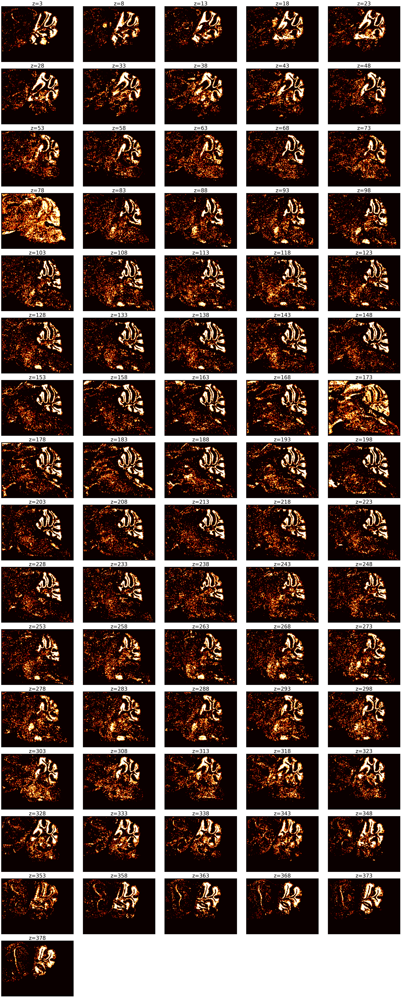

In [42]:
display_volume_sections(score_volume, cmap=plt.cm.hot)